In [1]:
# Install YOLOv8 and dependencies
!pip install ultralytics
!pip install opencv-python matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 66.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 104.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [11]:
import zipfile
import os

# Path to your ZIP file
zip_file_path = '/content/drive/MyDrive/brain_tumor_dataset/archive (5).zip'

# Path where you want to extract the ZIP file
extract_path = '/content/drive/MyDrive/brain_tumor_dataset/'

# Unzipping the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Files extracted to {extract_path}")


Files extracted to /content/drive/MyDrive/brain_tumor_dataset/


In [12]:
import os

# List the files and directories in the extracted folder
extracted_files = os.listdir(extract_path)
print(extracted_files)


['archive (5).zip', 'Brain Tumor labeled dataset']


In [15]:
import os
import shutil
import random
from tqdm import tqdm

# Set your paths
original_dataset_path = '/content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset'  # <- Update if needed
target_base = '/content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO'

# Class name to numeric label
class_mapping = {
    'glioma': 0,
    'meningioma': 1,
    'pituitary': 2,
    'no_tumor': 3
}

# Create YOLO folders
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(target_base, 'images', split), exist_ok=True)
    os.makedirs(os.path.join(target_base, 'labels', split), exist_ok=True)

# Collect all image-label pairs
all_data = []
for class_name, label in class_mapping.items():
    class_path = os.path.join(original_dataset_path, class_name)
    for file in os.listdir(class_path):
        if file.endswith('.jpg'):
            image_path = os.path.join(class_path, file)
            label_path = os.path.splitext(image_path)[0] + '.txt'
            if os.path.exists(label_path):
                all_data.append((image_path, label_path, label))
            else:
                print(f"⚠️ Label file missing for image {file}")

# Shuffle and split
random.shuffle(all_data)
total = len(all_data)
train_split = int(0.7 * total)
val_split = int(0.2 * total)

train_data = all_data[:train_split]
val_data = all_data[train_split:train_split + val_split]
test_data = all_data[train_split + val_split:]

# Function to move data
def move_data(data_list, split_name):
    for img_path, label_path, class_id in tqdm(data_list, desc=f'Processing {split_name}'):
        img_name = os.path.basename(img_path)
        label_name = os.path.basename(label_path)

        # Copy image
        shutil.copy(img_path, os.path.join(target_base, 'images', split_name, img_name))

        # Modify label file to ensure it starts with correct class ID
        with open(label_path, 'r') as f:
            content = f.read()

        # Write to new label file (overwrite original class with numeric class)
        new_label_path = os.path.join(target_base, 'labels', split_name, label_name)
        with open(new_label_path, 'w') as f:
            lines = content.strip().split('\n')
            for line in lines:
                coords = line.strip().split()
                if len(coords) == 5:
                    coords[0] = str(class_id)
                    f.write(' '.join(coords) + '\n')

# Move files to YOLO folders
move_data(train_data, 'train')
move_data(val_data, 'val')
move_data(test_data, 'test')

print("✅ Step 1 completed: Dataset organized for YOLOv8!")




Processing test: 100%|██████████| 218/218 [00:03<00:00, 56.99it/s]

✅ Step 1 completed: Dataset organized for YOLOv8!


In [17]:
yaml_content = """\
path: /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO
train: images/train
val: images/val
test: images/test

names:
  0: glioma
  1: meningioma
  2: pituitary
  3: no_tumor
"""

with open('/content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/data.yaml', 'w') as f:
    f.write(yaml_content)

print("✅ data.yaml created!")


✅ data.yaml created!


In [18]:
from ultralytics import YOLO

# Load a YOLOv8 model (you can also use 'yolov8s.pt' or others)
model = YOLO('yolov8n.pt')  # 'n' is for nano - fastest and smallest

# Train the model
model.train(
    data='/content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/data.yaml',
    epochs=25,
    imgsz=640,
    batch=16,
    name='brain_tumor_yolov8n'
)


Ultralytics 8.3.124 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/data.yaml, epochs=25, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=brain_tumor_yolov8n, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=F

train: Scanning /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/labels/train... 1522 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1522/1522 [00:19<00:00, 79.56it/s] 


train: New cache created: /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 1.1±0.4 ms, read: 10.6±7.8 MB/s, size: 23.6 KB)


val: Scanning /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/labels/val... 435 images, 1 backgrounds, 0 corrupt: 100%|██████████| 435/435 [00:04<00:00, 94.93it/s] 


val: New cache created: /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/labels/val.cache
Plotting labels to runs/detect/brain_tumor_yolov8n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/brain_tumor_yolov8n
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      2.85G      1.734      3.418      1.765          1        640: 100%|██████████| 96/96 [00:35<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.60it/s]

                   all        435        434      0.931      0.156      0.417      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      2.87G      1.563       2.29      1.582          3        640: 100%|██████████| 96/96 [00:30<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.42it/s]


                   all        435        434      0.412      0.566      0.507       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      2.89G      1.582      1.932      1.588          5        640: 100%|██████████| 96/96 [00:31<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.82it/s]


                   all        435        434       0.67      0.543      0.656      0.343

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      2.91G      1.566      1.678      1.562          4        640: 100%|██████████| 96/96 [00:32<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.82it/s]

                   all        435        434      0.699      0.547      0.656      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      2.92G      1.552      1.543      1.543          1        640: 100%|██████████| 96/96 [00:31<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.82it/s]

                   all        435        434      0.679      0.477      0.592      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      2.94G       1.48      1.392      1.518          3        640: 100%|██████████| 96/96 [00:31<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.93it/s]


                   all        435        434      0.756      0.658      0.745       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      2.96G      1.484      1.299      1.504          2        640: 100%|██████████| 96/96 [00:31<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.27it/s]


                   all        435        434      0.807       0.75      0.813      0.455

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      2.97G      1.452      1.202      1.488          2        640: 100%|██████████| 96/96 [00:31<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.18it/s]

                   all        435        434       0.72      0.692      0.776      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      2.99G      1.446      1.189      1.476          7        640: 100%|██████████| 96/96 [00:32<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.58it/s]

                   all        435        434      0.732      0.776      0.809       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      3.01G      1.422      1.124      1.447          3        640: 100%|██████████| 96/96 [00:31<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.45it/s]

                   all        435        434      0.749      0.799      0.849       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      3.02G      1.394      1.057      1.424          5        640: 100%|██████████| 96/96 [00:31<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.24it/s]

                   all        435        434      0.837      0.797      0.864      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      3.04G      1.385      1.026       1.41          4        640: 100%|██████████| 96/96 [00:31<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.23it/s]

                   all        435        434      0.823      0.804      0.865      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      3.06G      1.366     0.9945      1.396          4        640: 100%|██████████| 96/96 [00:31<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.34it/s]

                   all        435        434      0.847      0.766      0.855      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      3.07G      1.361     0.9516      1.399          2        640: 100%|██████████| 96/96 [00:33<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.06it/s]

                   all        435        434      0.839      0.829      0.894      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      3.09G      1.332     0.9125      1.389          4        640: 100%|██████████| 96/96 [00:31<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.61it/s]

                   all        435        434      0.859      0.794      0.886       0.51


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      3.11G      1.374     0.8707      1.488          2        640: 100%|██████████| 96/96 [00:31<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.19it/s]

                   all        435        434      0.834      0.806      0.864      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      3.12G      1.352     0.7967      1.458          2        640: 100%|██████████| 96/96 [00:29<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.27it/s]

                   all        435        434      0.908      0.808       0.89      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      3.14G      1.327     0.7688      1.456          2        640: 100%|██████████| 96/96 [00:30<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.31it/s]

                   all        435        434      0.837      0.844       0.89      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      3.16G      1.312     0.7472       1.43          2        640: 100%|██████████| 96/96 [00:30<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.32it/s]

                   all        435        434      0.873      0.846      0.907      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      3.18G      1.278     0.7106      1.413          2        640: 100%|██████████| 96/96 [00:29<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.09it/s]

                   all        435        434      0.869      0.818      0.893      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      3.19G      1.249     0.6752      1.386          2        640: 100%|██████████| 96/96 [00:29<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.77it/s]

                   all        435        434       0.89      0.834      0.905      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      3.21G      1.227     0.6642      1.367          2        640: 100%|██████████| 96/96 [00:29<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.02it/s]


                   all        435        434      0.882      0.864      0.914      0.549

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      3.23G       1.22     0.6324      1.369          2        640: 100%|██████████| 96/96 [00:28<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.85it/s]

                   all        435        434      0.881       0.86      0.913      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      3.24G      1.185     0.6293      1.351          2        640: 100%|██████████| 96/96 [00:29<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.29it/s]

                   all        435        434      0.897      0.854      0.919      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      3.26G      1.166      0.591      1.322          2        640: 100%|██████████| 96/96 [00:29<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.28it/s]

                   all        435        434      0.894      0.859       0.92      0.551



25 epochs completed in 0.255 hours.
Optimizer stripped from runs/detect/brain_tumor_yolov8n/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/brain_tumor_yolov8n/weights/best.pt, 6.2MB

Validating runs/detect/brain_tumor_yolov8n/weights/best.pt...
Ultralytics 8.3.124 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:08<00:00,  1.73it/s]


                   all        435        434      0.897      0.854      0.918      0.552
                glioma         87         87      0.805      0.667      0.769        0.4
            meningioma        101        101      0.978       0.89      0.969      0.575
             pituitary        124        124      0.941        0.9      0.954      0.513
              no_tumor        122        122      0.862      0.959      0.981      0.718
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to runs/detect/brain_tumor_yolov8n


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7955e033b810>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [19]:
metrics = model.val()


Ultralytics 8.3.124 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 14.1±9.3 MB/s, size: 24.9 KB)


val: Scanning /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/labels/val.cache... 435 images, 1 backgrounds, 0 corrupt: 100%|██████████| 435/435 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:06<00:00,  4.01it/s]


                   all        435        434      0.902      0.854      0.919       0.55
                glioma         87         87      0.816      0.667      0.774        0.4
            meningioma        101        101      0.978      0.889      0.969      0.575
             pituitary        124        124      0.941        0.9      0.954      0.512
              no_tumor        122        122      0.871      0.959      0.981      0.713
Speed: 0.9ms preprocess, 5.6ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/brain_tumor_yolov8n2


In [20]:
results = model.predict(source='/content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test', save=True, conf=0.25)



image 1/218 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0015.jpg: 640x640 (no detections), 7.4ms
image 2/218 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0016.jpg: 640x640 2 gliomas, 7.4ms
image 3/218 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0040.jpg: 640x640 1 glioma, 22.4ms
image 4/218 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0042.jpg: 640x640 3 gliomas, 7.5ms
image 5/218 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0072.jpg: 640x640 1 glioma, 7.4ms
image 6/218 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0082.jpg: 640x640 1 glioma, 7.4ms
image 7/218 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled da

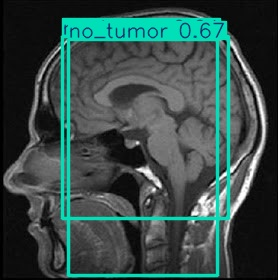

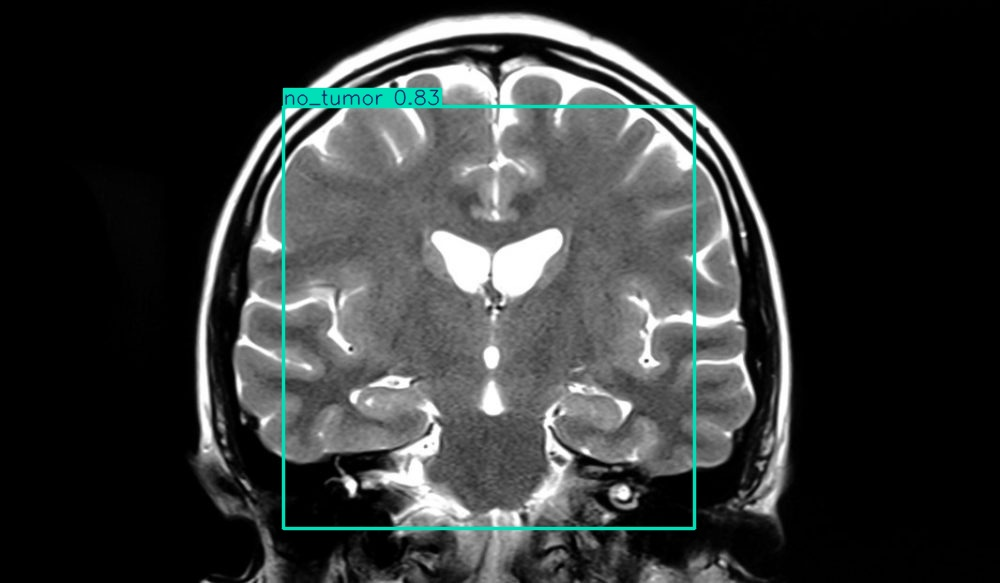

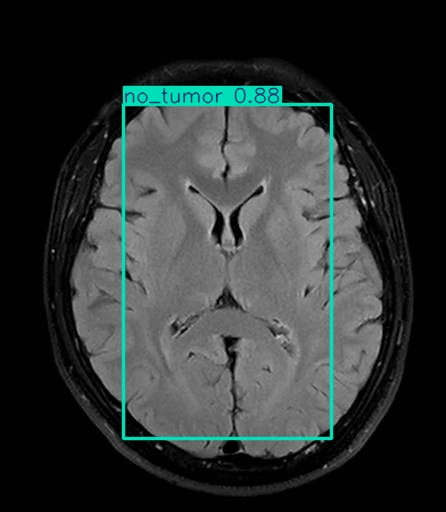

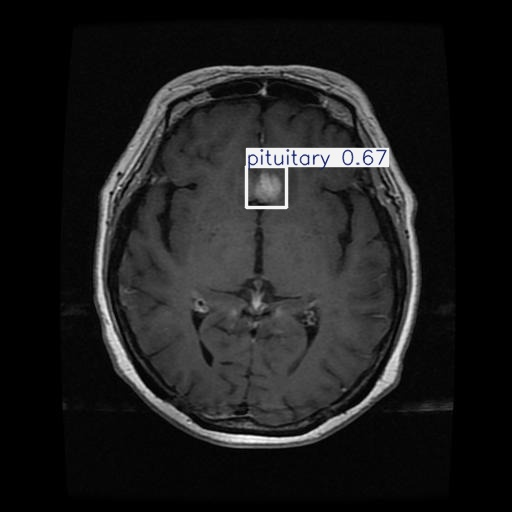

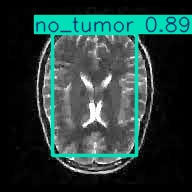

...

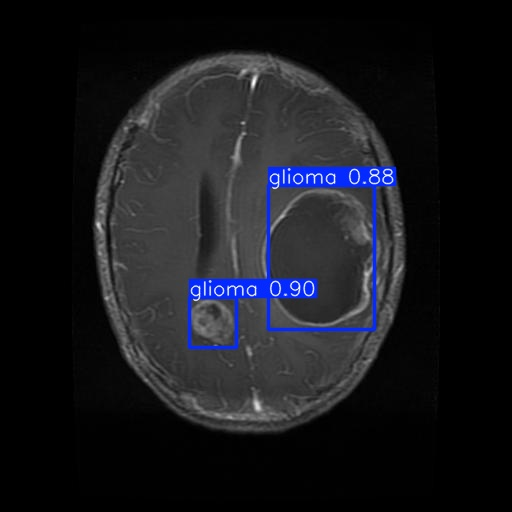

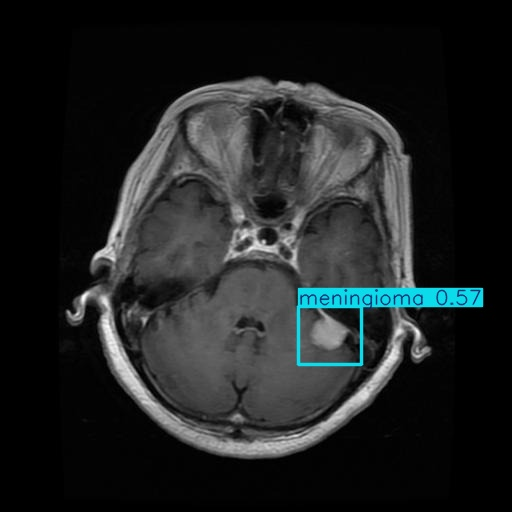

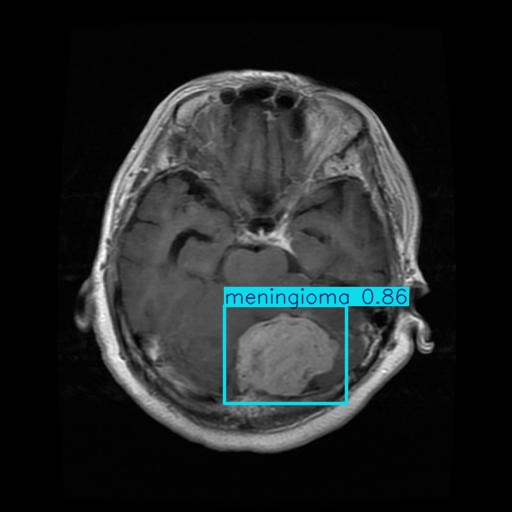

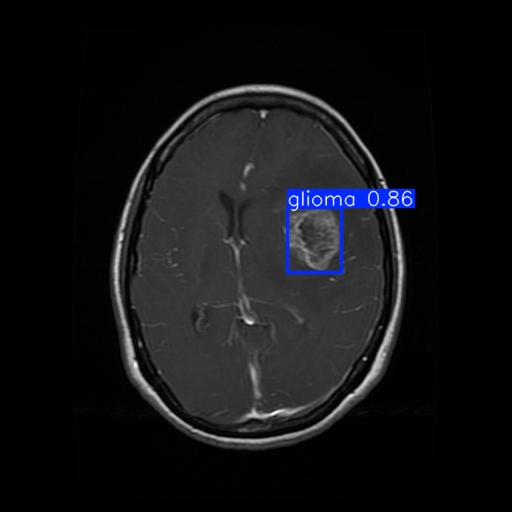

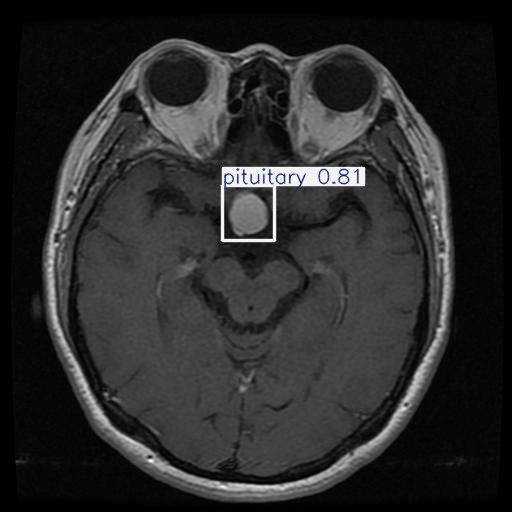

In [22]:
import os
from IPython.display import Image, display

pred_dir = '/content/runs/detect/brain_tumor_yolov8n3'
images = [f for f in os.listdir(pred_dir) if f.endswith('.jpg')]

# Display first 5 predicted images
for img in images[:20]:
    display(Image(filename=os.path.join(pred_dir, img)))


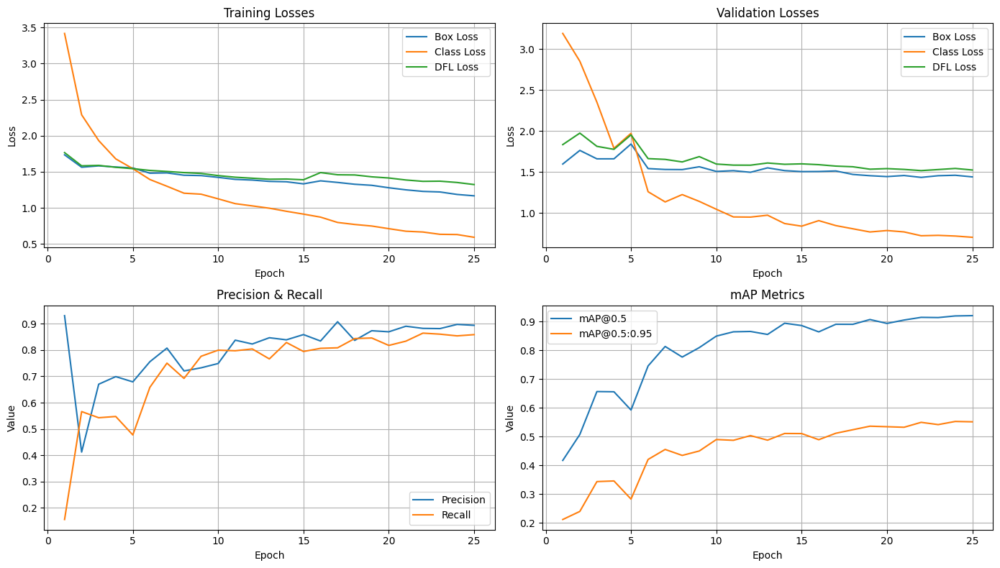

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the results
df = pd.read_csv('runs/detect/brain_tumor_yolov8n/results.csv')

# Plotting
plt.figure(figsize=(14, 8))

# Plot training losses
plt.subplot(2, 2, 1)
plt.plot(df['epoch'], df['train/box_loss'], label='Box Loss')
plt.plot(df['epoch'], df['train/cls_loss'], label='Class Loss')
plt.plot(df['epoch'], df['train/dfl_loss'], label='DFL Loss')
plt.title('Training Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot validation losses
plt.subplot(2, 2, 2)
plt.plot(df['epoch'], df['val/box_loss'], label='Box Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Class Loss')
plt.plot(df['epoch'], df['val/dfl_loss'], label='DFL Loss')
plt.title('Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot metrics
plt.subplot(2, 2, 3)
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
plt.title('Precision & Recall')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.grid(True)

plt.subplot(2, 2, 4)
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.title('mAP Metrics')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [26]:
# Run prediction on your custom image
results = model.predict(source='/content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0015.jpg', save=True, conf=0.25)



image 1/1 /content/drive/MyDrive/brain_tumor_dataset/Brain Tumor labeled dataset/Brain_Tumor_YOLO/images/test/Tr-gl_0015.jpg: 640x640 (no detections), 18.7ms
Speed: 7.3ms preprocess, 18.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


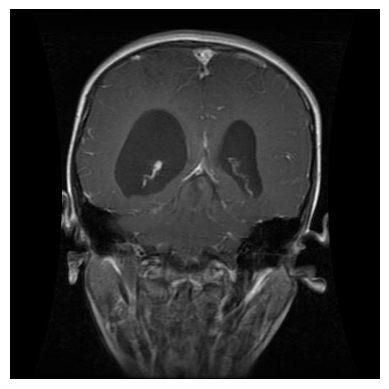

In [27]:
import matplotlib.pyplot as plt

plt.imshow(results[0].plot())  # `plot()` draws the boxes on the image
plt.axis('off')
plt.show()


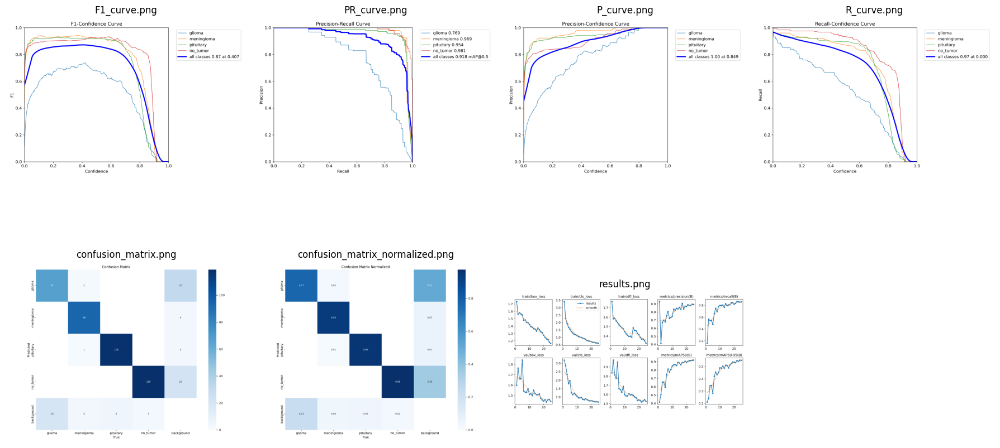

In [29]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# List of image paths
image_paths = [
    '/content/runs/detect/brain_tumor_yolov8n/F1_curve.png',
    '/content/runs/detect/brain_tumor_yolov8n/PR_curve.png',
    '/content/runs/detect/brain_tumor_yolov8n/P_curve.png',
    '/content/runs/detect/brain_tumor_yolov8n/R_curve.png',
    '/content/runs/detect/brain_tumor_yolov8n/confusion_matrix.png',
    '/content/runs/detect/brain_tumor_yolov8n/confusion_matrix_normalized.png',
    '/content/runs/detect/brain_tumor_yolov8n/results.png',
]

# Plot all images in a grid
plt.figure(figsize=(18, 10))
for i, path in enumerate(image_paths):
    img = mpimg.imread(path)
    plt.subplot(2, 4, i + 1)  # adjust grid size based on number of images
    plt.imshow(img)
    plt.title(path.split('/')[-1])
    plt.axis('off')

plt.tight_layout()
plt.show()


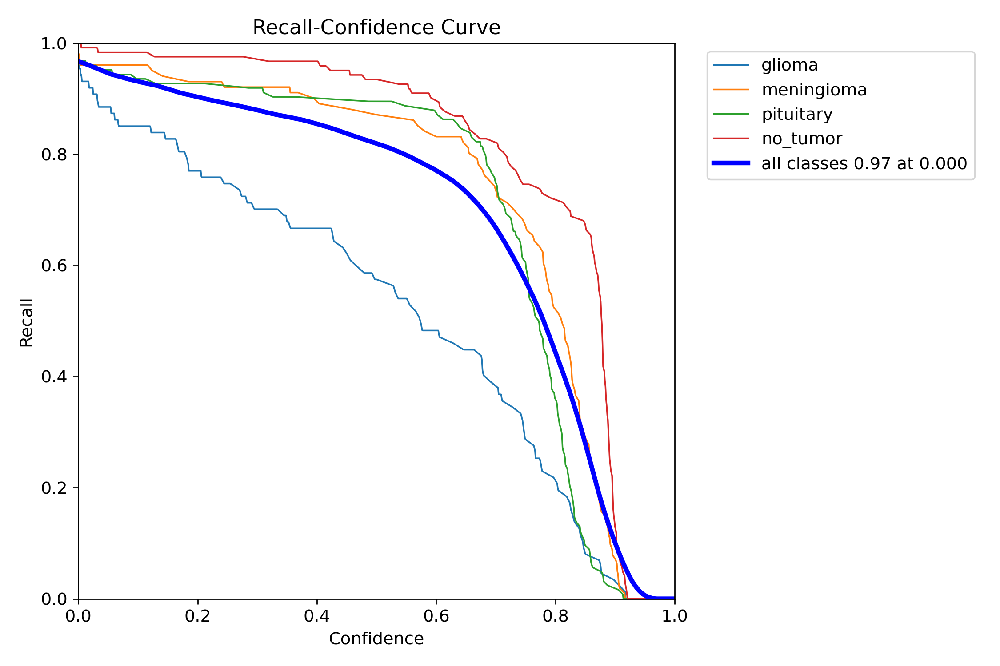

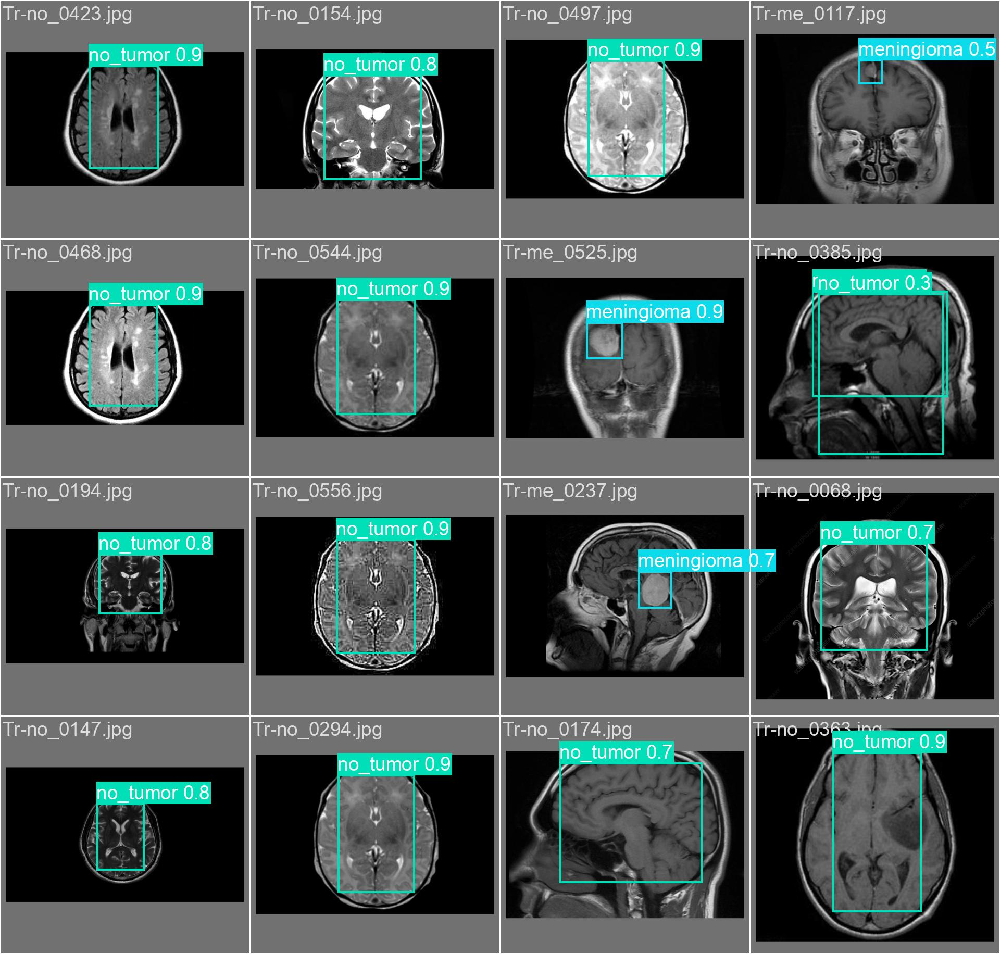

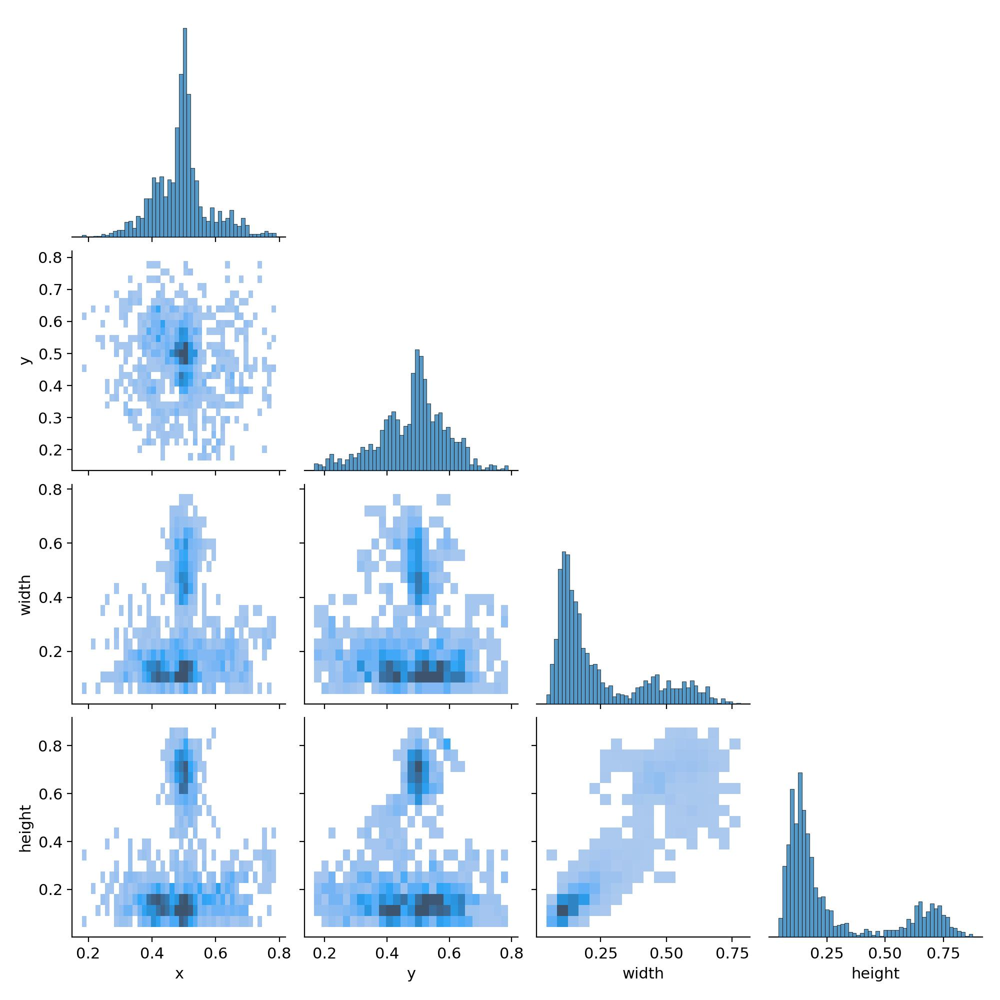

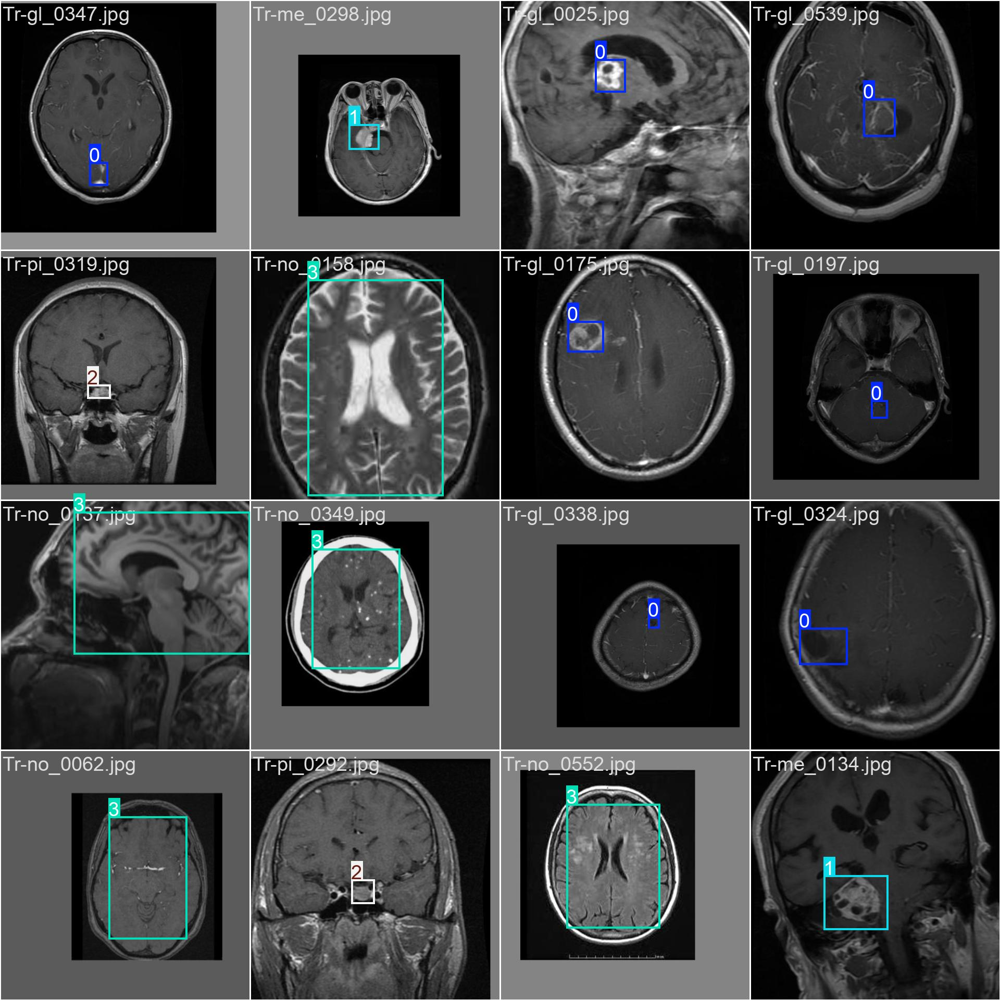

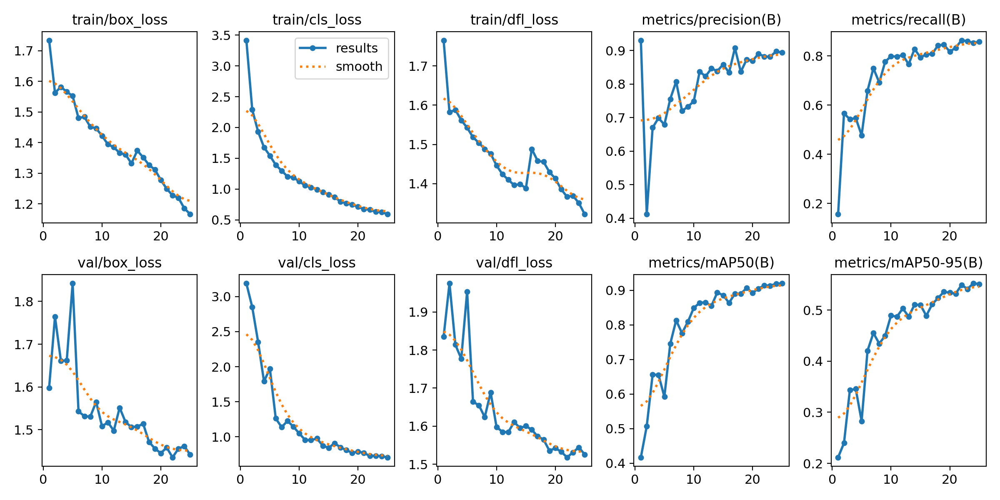

...

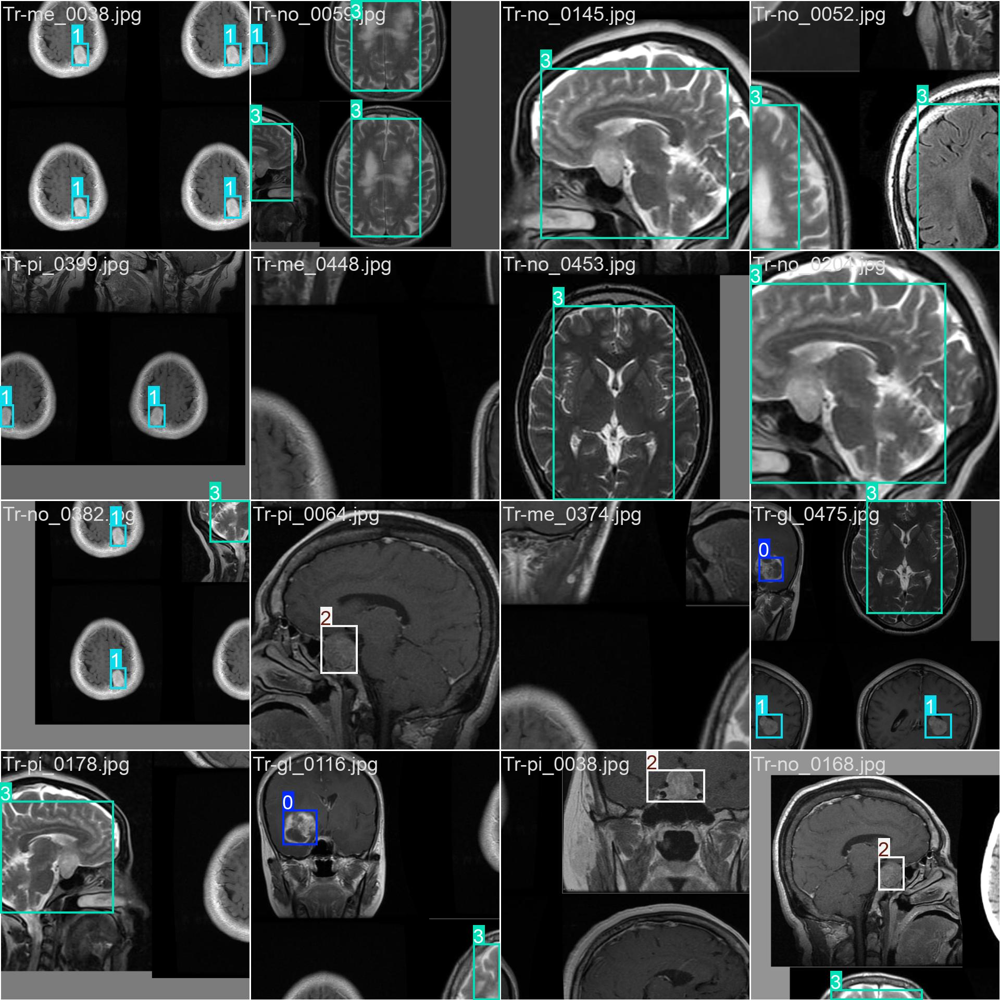

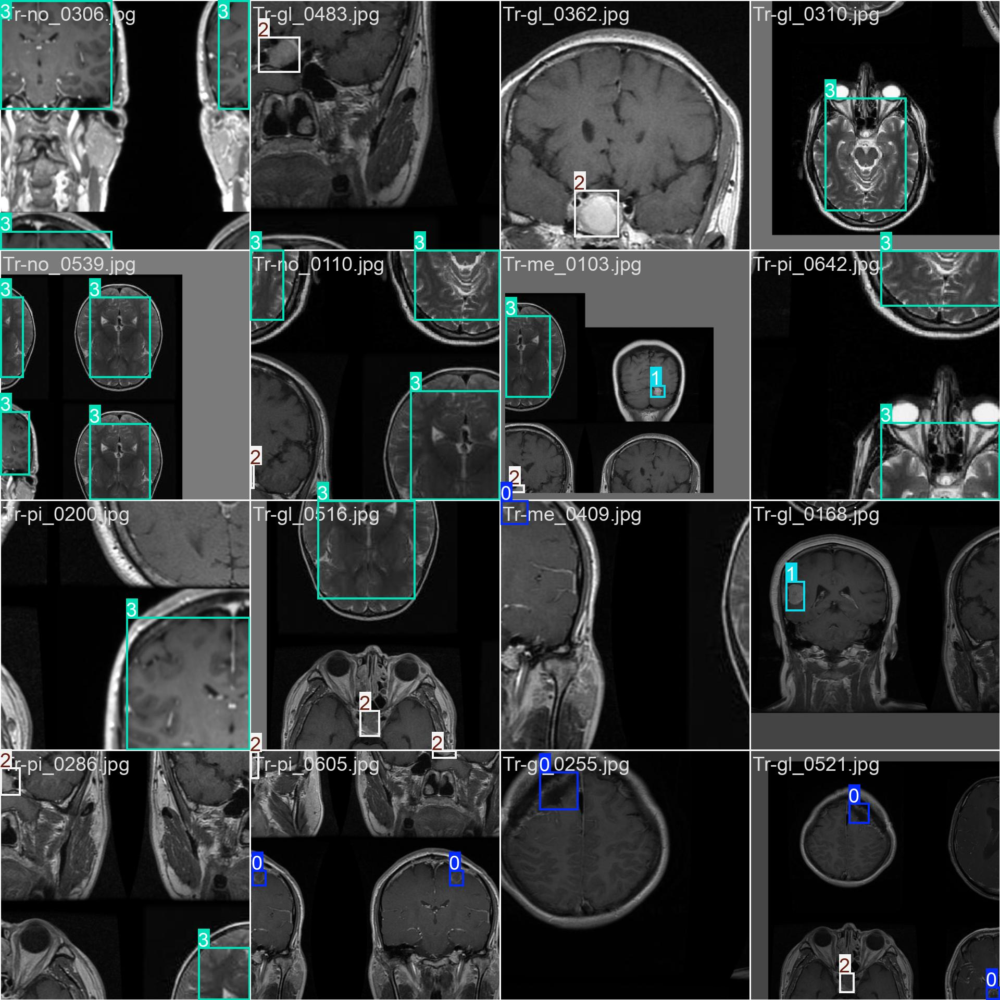

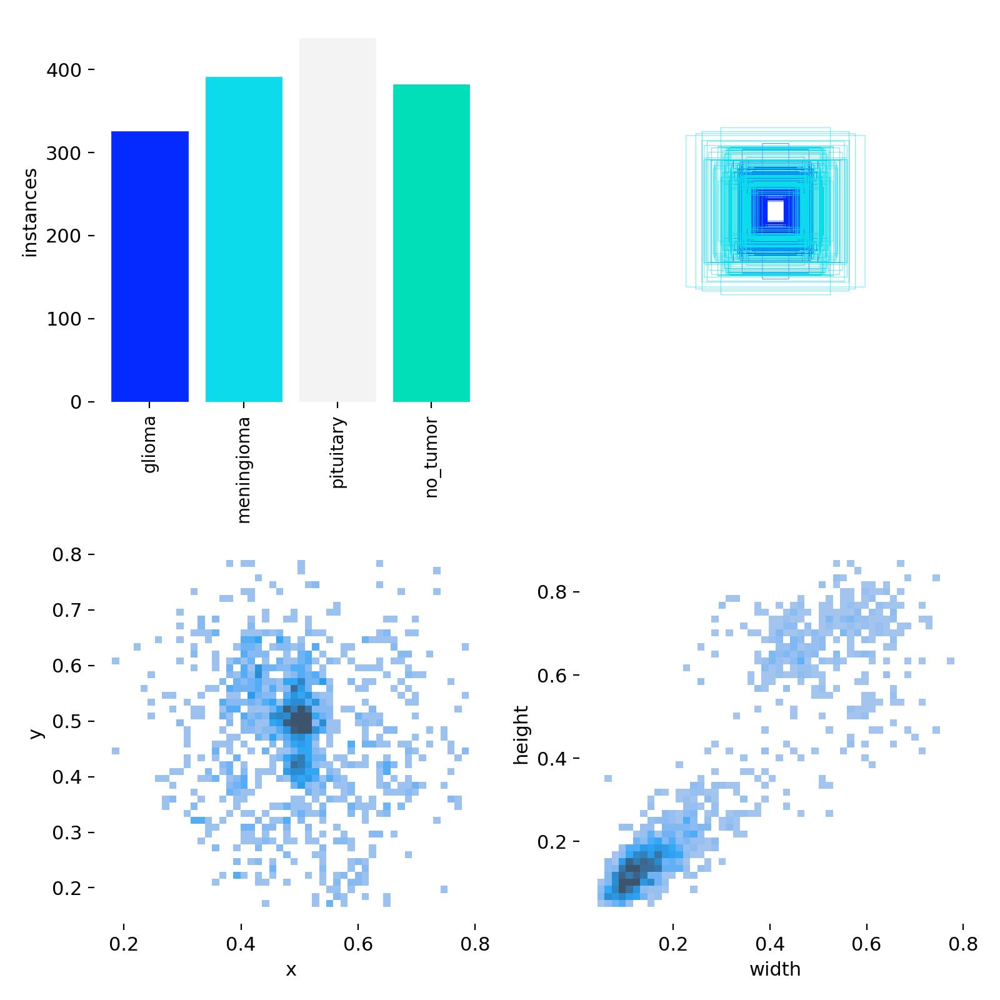

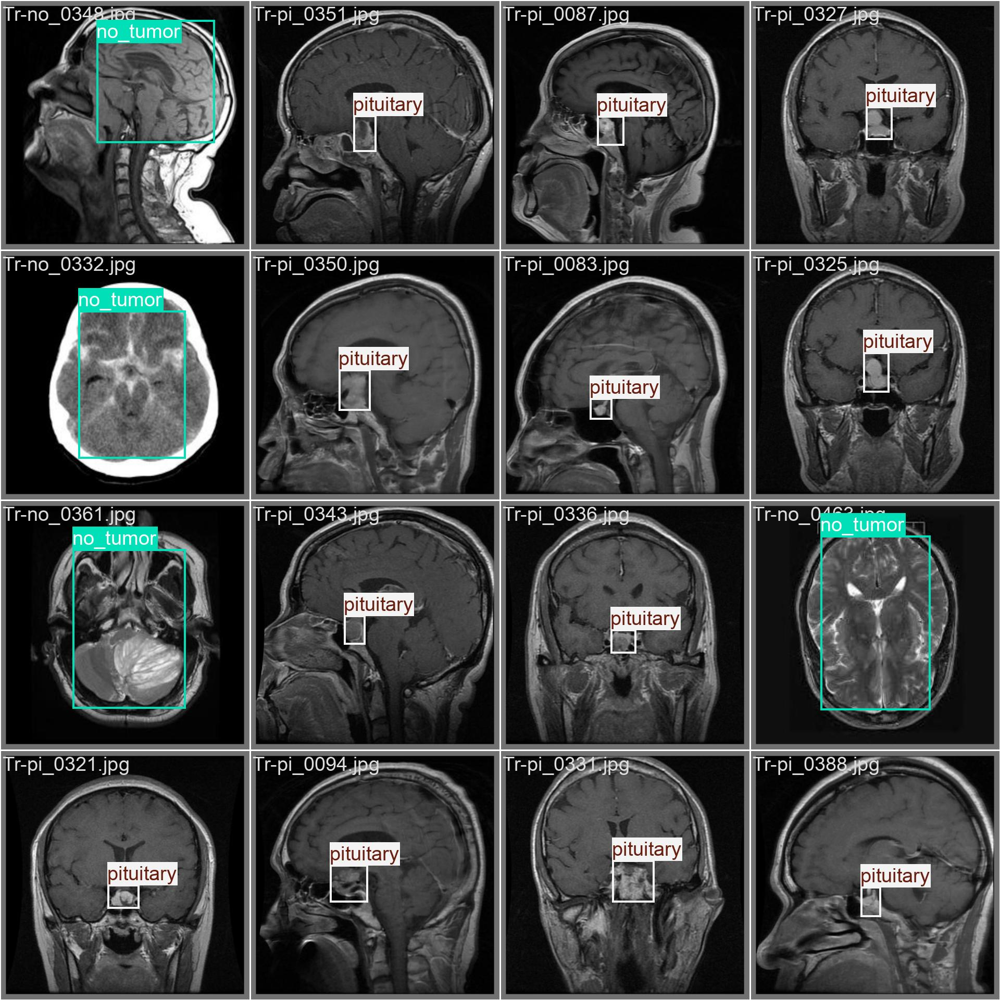

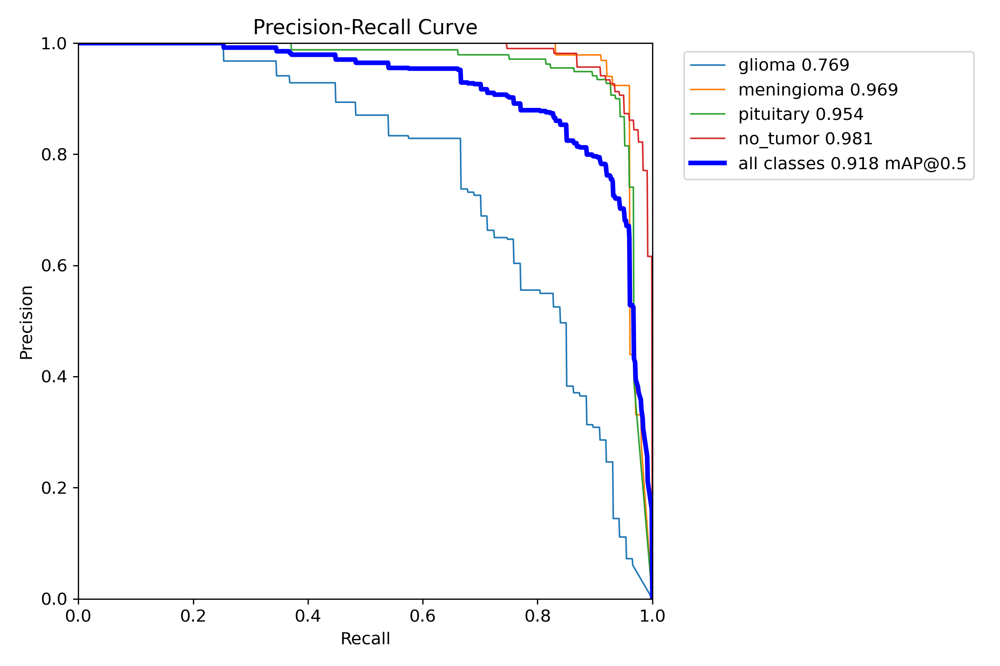

In [30]:
import os
from IPython.display import Image, display
from pathlib import Path

# Path to your folder (change if needed)
folder_path = '/content/runs/detect/brain_tumor_yolov8n'

# Get all image files (with extensions like .png, .jpg, .jpeg)
image_extensions = ['.png', '.jpg', '.jpeg']
image_files = [f for f in os.listdir(folder_path) if Path(f).suffix.lower() in image_extensions]

# Display images
for img_file in image_files:
    display(Image(filename=os.path.join(folder_path, img_file)))
